<a href="https://colab.research.google.com/github/afvallejo/Parse_bio/blob/main/3_Annotation_Parse_bio_67kPBMC_pynb.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 67K PBMC from Parce Biosciences
[Data](https://resources.parsebiosciences.com/downloads?submissionGuid=08058314-f0eb-4585-8cc3-2eff8f0fc091)

### Andres F. Vallejo 29/10/21

# Setup

## link Gdrive

In [1]:
from google.colab import drive
drive.mount('/content/drive',force_remount=True)

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.activity.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fexperimentsandconfigs%20https%3a%2f%2fwww.googleapis.com%2fauth%2fphotos.native&response_type=code

Enter your authorization code:
4/1AX4XfWhBz5wSUN2NNJKjzII0V_SHvM-PY7mmrZ2IRFbhT3eFjWWJGCHLUXU
Mounted at /content/drive


In [2]:
!mkdir MyDrive   
!mount --bind /content/drive/My\ Drive /content/MyDrive

#Colab

In [3]:
%cd /content/

/content


In [ ]:
!pip install pynndescent
!pip install -q condacolab
import condacolab
condacolab.install()

!conda install -y graphviz
!pip install cffi==1.14.6
!pip install pygraphviz
!pip install leidenalg
!pip install umap-learn==0.5.1
!pip install scanpy
!pip install cello-classify
import umap
umap.__version__ = '0.5.1'


In [9]:
#cello_resource_loc = os.getcwd()
cello_resource_loc = "."

In [4]:
!cp /content/MyDrive/tools/scanpy.zip /content/

In [5]:
%%capture
!unzip /content/scanpy.zip

In [ ]:
pip install setuptools-scm install scanpy anndata leidenalg scrublet bbknn

In [7]:
import os
os.environ["FLIT_ROOT_INSTALL"] = "1"

In [ ]:
!python3 -m pip install flit

In [9]:
%cd /content/scanpy-02b091a02a6bc962ee83ebeea85bffe8746f1859

/content/scanpy-02b091a02a6bc962ee83ebeea85bffe8746f1859


In [ ]:
!flit install -s --deps=develop

## Load packages

In [1]:
import scanpy as sc
import numpy as np
import re
import pandas as pd
import seaborn as sb
import matplotlib
import matplotlib.pyplot as pl
import scanpy.external as sce
from matplotlib import colors
import bbknn
import cello
pl.rcParams['pdf.fonttype'] = 'truetype'
sc.set_figure_params(vector_friendly=False,dpi_save=300,transparent=True)
pl.rcParams['lines.linewidth'] = 0.1
sc.set_figure_params(color_map='viridis')
colorsComb = np.vstack([pl.cm.Reds(np.linspace(0, 1, 10)), pl.cm.Greys_r(np.linspace(0.7, 0.8, 0))])
mymap = colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)


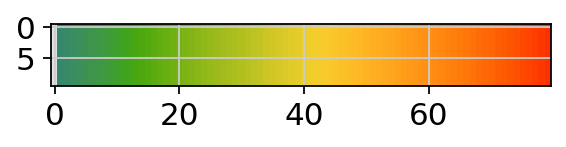

In [2]:
import colorcet as cc

xs, _ = np.meshgrid(np.linspace(0, 1, 80), np.linspace(0, 1, 10))
colorsComb = np.vstack([pl.cm.Greys_r(np.linspace(0.8,0.1, 1)), cc.cm.rainbow_bgyr_35_85_c72(np.linspace(0.2,1, 100))])
mymap = colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)
pl.imshow(xs, cmap=mymap);  # use tab completion to choose

# Setup

## set WD

In [3]:
folder='/content/MyDrive/Parse_Biosciences/PBMC/'

samplename='PBMC'
random_state=42

import os
os.chdir(folder)
if not os.path.exists('./figures'):
    os.makedirs('./figures')

In [4]:
ls

cache/                  genes1.csv         PBMC_normalized.h5ad
cell_metadata.csv       genes.csv          PBMC_NORMAL.model.dill
condacolab_install.log  matrix.mtx.gz      resources/
figures/                PBMC_cluster.h5ad


# Load the data

In [ ]:
#adata = sc.read_mtx("./matrix.mtx.gz",)
gene_names = pd.read_csv('genes.csv' , header=0,)
cell_names = pd.read_csv('cell_metadata.csv' , header=0)
adata.var_names=gene_names['gene_name']
adata.obs_names=cell_names['bc_index']
adata.var=adata.var.drop(['gene_name'], axis=1)
adata.obs=adata.obs.drop(['bc_index'], axis=1)

In [ ]:
adata.var_names_make_unique()
adata.obs_names_make_unique()

In [ ]:
adata


AnnData object with n_obs × n_vars = 67322 × 58395
    obs: 'species', 'sample', 'tscp_count', 'tscp_count_50dup', 'gene_count', 'n_counts', 'log_counts', 'n_genes', 'mt_frac', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito'
    var: 'gene_id', 'genome', 'mito', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'sample_colors'
    layers: 'counts'

In [ ]:
# Quality control - calculate QC covariates
adata.obs['n_counts'] = adata.X.sum(1)
adata.obs['log_counts'] = np.log(adata.obs['n_counts'])
adata.obs['n_genes'] = (adata.X > 0).sum(1)



# compute qc metrics
regex = re.compile('^(MT-).*', re.IGNORECASE)
mito_genes = [l for l in adata.var_names for m in [regex.search(l)] if m]
adata.var['mito'] = False
adata.var.loc[mito_genes, 'mito'] = True
adata.obs['mt_frac'] = np.sum(
    adata[:, mito_genes].X, axis=1).A1 / np.sum(adata.X, axis=1).A1
print('Found {} mito genes and annotated.'.format(len(mito_genes)))

sc.pp.calculate_qc_metrics(adata, qc_vars=['mito'], inplace=True)


adata

Found 37 mito genes and annotated.


AnnData object with n_obs × n_vars = 67322 × 58395
    obs: 'species', 'sample', 'tscp_count', 'tscp_count_50dup', 'gene_count', 'n_counts', 'log_counts', 'n_genes', 'mt_frac', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito'
    var: 'gene_id', 'genome', 'mito', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'sample_colors'
    layers: 'counts'

In [ ]:
adata.layers["counts"]=adata.X

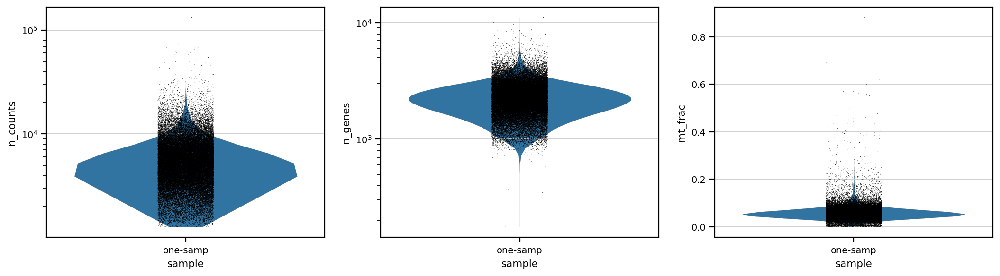

In [ ]:
sb.set_context('paper')
pl.rcParams['lines.linewidth'] = 0.1
import matplotlib.pyplot as plt

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(16,4), gridspec_kw={'wspace':0.2})

ax1_dict = sc.pl.violin(adata, 'n_counts', groupby='sample', size=0.5, log=True, cut=0, ax=ax1, show=False)
ax2_dict =  sc.pl.violin(adata, 'n_genes', groupby='sample', size=0.5, log=True, cut=0, ax=ax2, show=False)
ax3_dict = sc.pl.violin(adata, 'mt_frac', groupby='sample',size=0.5, ax=ax3, show=False,)
savefig='figures/'+samplename + '_5_QC_violin_plots.pdf'
fig.savefig(savefig, dpi=300, bbox_inches='tight')

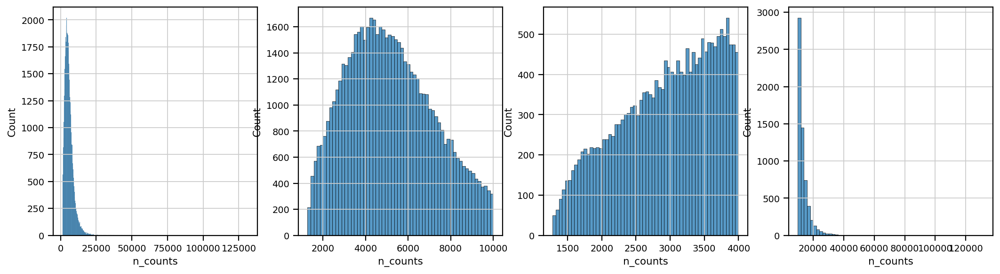

In [ ]:
sb.set_context('paper')
pl.rcParams['lines.linewidth'] = 0.1
import matplotlib.pyplot as plt

fig, (ax1, ax2, ax3,ax4) = plt.subplots(1, 4, figsize=(16,4), gridspec_kw={'wspace':0.2})

ax1_dict = sb.histplot(adata.obs['n_counts'], kde=False, ax=ax1,)
ax2_dict =  sb.histplot(adata.obs['n_counts'][adata.obs['n_counts']<10000], kde=False, bins=60, ax=ax2,)
ax3_dict =  sb.histplot(adata.obs['n_counts'][adata.obs['n_counts']<4000], kde=False, bins=60, ax=ax3,)
ax4_dict = sb.histplot(adata.obs['n_counts'][adata.obs['n_counts']>10000], kde=False, bins=60, ax=ax4, )
savefig='figures/'+samplename + '_1_QC_counts_filtering.pdf'
fig.savefig(savefig, dpi=300, bbox_inches='tight')

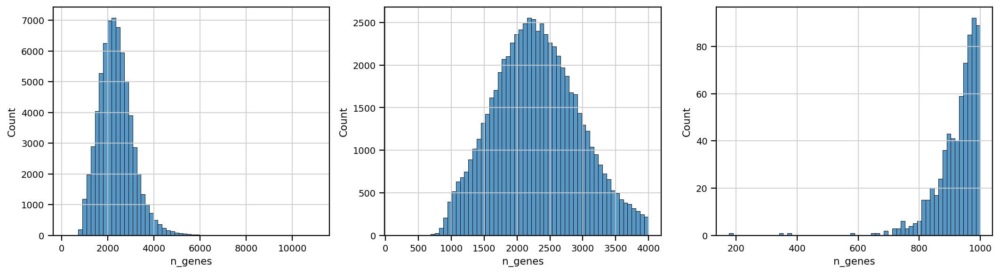

In [ ]:
sb.set_context('paper')
pl.rcParams['lines.linewidth'] = 0.1
import matplotlib.pyplot as plt

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(16,4), gridspec_kw={'wspace':0.2})

ax1_dict = sb.histplot(adata.obs['n_genes'], kde=False, bins=60, ax=ax1,)
ax2_dict =  sb.histplot(adata.obs['n_genes'][adata.obs['n_genes']<4000], kde=False, bins=60, ax=ax2,)
ax3_dict =  sb.histplot(adata.obs['n_genes'][adata.obs['n_genes']<1000], kde=False, bins=60, ax=ax3,)
savefig='figures/'+samplename + '_2_QC_gene_filtering.pdf'
fig.savefig(savefig, dpi=300, bbox_inches='tight')

In [ ]:
# Filter cells according to identified QC thresholds:
print('Total number of cells: {:d}'.format(adata.n_obs))

sc.pp.filter_cells(adata, min_counts = 500)
print('Number of cells after min count filter: {:d}'.format(adata.n_obs))

sc.pp.filter_cells(adata, max_counts = 50000)
print('Number of cells after max count filter: {:d}'.format(adata.n_obs))

adata = adata[adata.obs['mt_frac'] < 0.3]
print('Number of cells after MT filter: {:d}'.format(adata.n_obs))

sc.pp.filter_cells(adata, min_genes = 250)
print('Number of cells after gene filter: {:d}'.format(adata.n_obs))

Total number of cells: 67322
Number of cells after min count filter: 67322
Number of cells after max count filter: 67302
Number of cells after MT filter: 67227


Trying to set attribute `.obs` of view, copying.


Number of cells after gene filter: 67227


In [ ]:
adata.layers["sqrt_norm"] = np.sqrt(
    sc.pp.normalize_total(adata, inplace=False)["X"])

# Normalization

In [ ]:
sc.experimental.pp.recipe_pearson_residuals(adata,n_top_genes=2000,n_comps=100,random_state=42,inplace=True,batch_key= 'sample')
adata

AnnData object with n_obs × n_vars = 67227 × 58395
    obs: 'species', 'sample', 'tscp_count', 'tscp_count_50dup', 'gene_count', 'n_counts', 'log_counts', 'n_genes', 'mt_frac', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito'
    var: 'gene_id', 'genome', 'mito', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'means', 'variances', 'residual_variances', 'highly_variable_rank', 'highly_variable_nbatches', 'highly_variable_intersection', 'highly_variable'
    uns: 'sample_colors', 'hvg', 'pca', 'pearson_residuals_normalization'
    obsm: 'X_pca'
    varm: 'PCs'
    layers: 'counts', 'sqrt_norm'

In [ ]:
adata.layers["normalized"]=adata.X

## Removal of Mitochondrial and Ribosomal Protein Genes

In [ ]:
ribo_genes = adata.var_names.str.startswith(("RPS","RPL"))
mito_genes = adata.var_names.str.startswith('MT-')
malat1 = adata.var_names.str.startswith('MALAT1')
remove = np.add(ribo_genes,mito_genes)
remove = np.add(remove,malat1)
kept_genes = np.invert(remove)

In [ ]:
adata = adata[:,kept_genes]

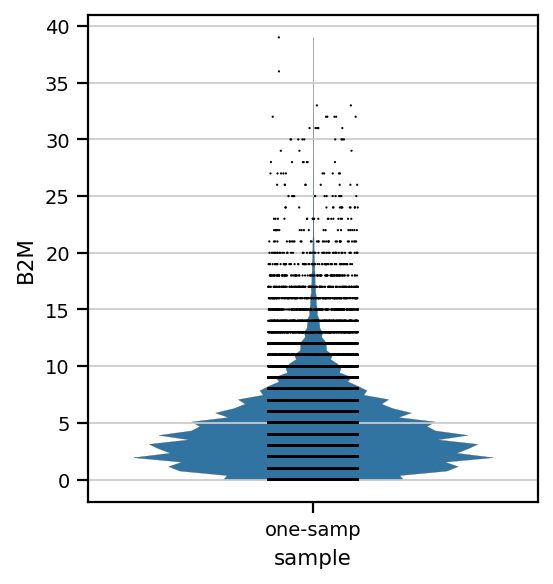

In [ ]:
sc.pl.violin(adata, ['B2M'],groupby='sample')

In [ ]:
adata.layers["normalized"]=adata.X
sc.pp.log1p(adata)
adata.layers["logcounts"] = adata.X

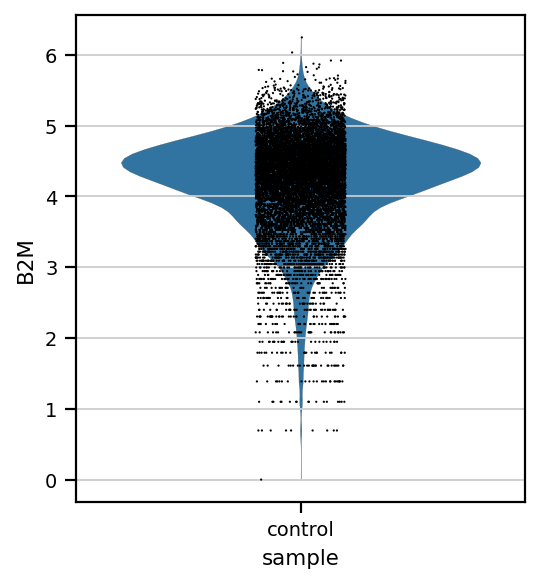

In [ ]:
sc.pl.violin(adata, ['B2M'],groupby='sample',)

In [ ]:
# Store the full data set in 'raw' as log-normalised data for statistical testing
adata.raw = adata

In [ ]:
normalized=samplename+"_normalized.h5ad"
print(normalized)
adata.write(normalized)


PBMC_normalized.h5ad


In [ ]:
normalized=samplename+"_normalized.h5ad"
adata=sc.read(normalized)
adata

AnnData object with n_obs × n_vars = 12513 × 36484
    obs: 'sample', 'condition', 'donnor', 'n_counts', 'log_counts', 'n_genes', 'mt_frac', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito', 'doublet_score', 'predicted_doublet', 'D1_VitD3,D2_VitD3,D3_VitD3'
    var: 'gene_ids', 'feature_types', 'mito', 'n_cells_by_counts-0', 'mean_counts-0', 'log1p_mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'log1p_total_counts-0', 'n_cells_by_counts-1', 'mean_counts-1', 'log1p_mean_counts-1', 'pct_dropout_by_counts-1', 'total_counts-1', 'log1p_total_counts-1', 'n_cells_by_counts-2', 'mean_counts-2', 'log1p_mean_counts-2', 'pct_dropout_by_counts-2', 'total_counts-2', 'log1p_total_counts-2', 'means', 'variances', 'residual_variances', 'highly_variable_rank', 'highl

# PCA

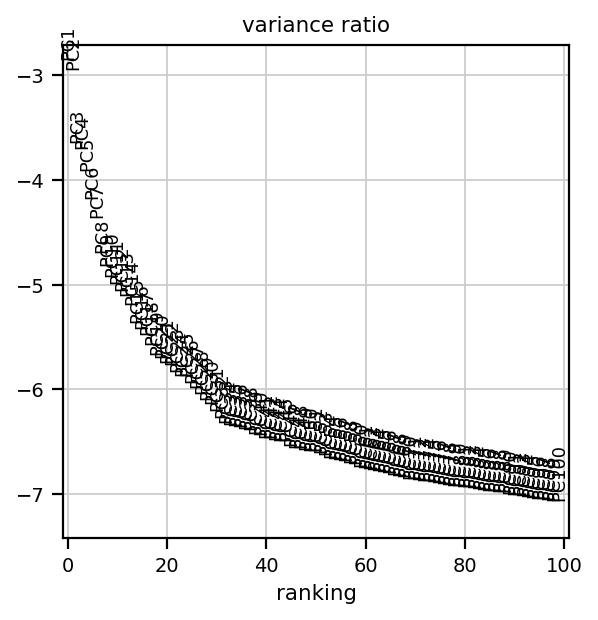

In [ ]:
sc.pl.pca_variance_ratio(adata, n_pcs = 100,log=True)

In [ ]:
####################################
# for using with corrected counts as X only
####################################
#sc.pp.scale(adata,max_value=10)

In [ ]:
#sc.pp.pca(adata, n_comps = 100, use_highly_variable =True, svd_solver = "arpack")
#sc.pl.pca_variance_ratio(adata, n_pcs = 100,log=True)

In [ ]:
#sce.pp.bbknn(adata,batch_key='Group', n_pcs = 100,metric='angular')
#'angular', 'euclidean', 'manhattan', and 'hamming'
#sce.pp.mnn_correct(adata,batch_key='run')

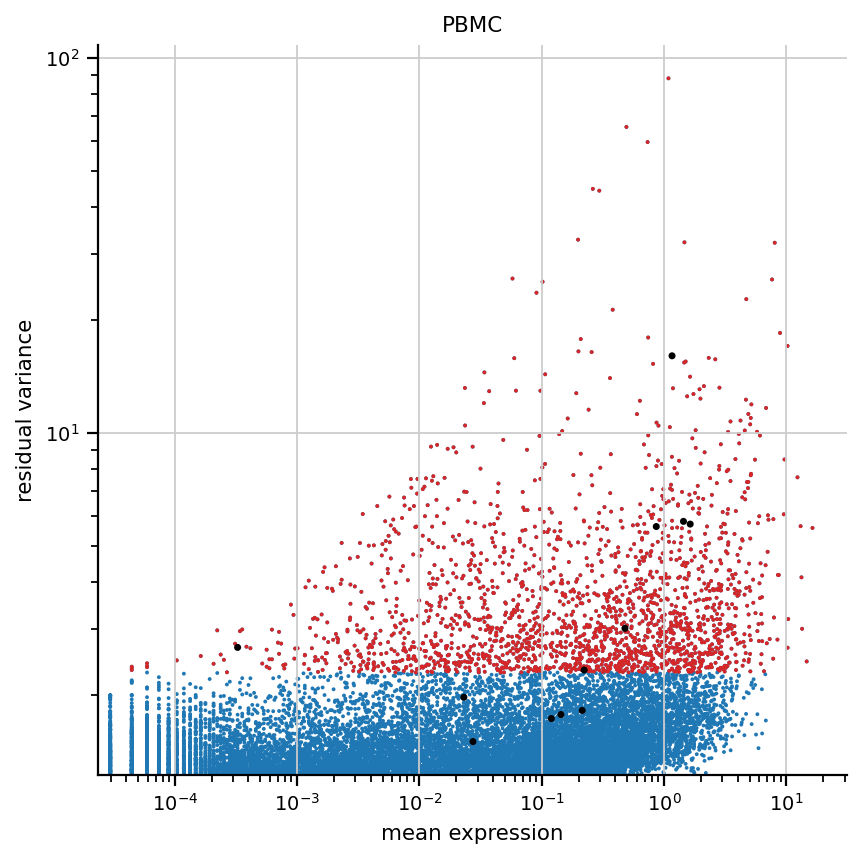

In [ ]:
markers = ["IL7R","LYZ","CD14","MS4A1","CD8A","GNLY","NKG7","FCGR3A","MS4A7","FCER1A","CST3","PPBP",]
hvgs = adata.var["highly_variable"]
fig, ax = plt.subplots(figsize=(6, 6))
pl.scatter(
        adata.var["mean_counts"], adata.var["residual_variances"], s=3, edgecolor="none"
    )
pl.scatter(
        adata.var["mean_counts"][hvgs],
        adata.var["residual_variances"][hvgs],
        c="tab:red",
        label="selected genes",
        s=3,
        edgecolor="none",
    )
pl.scatter(
        adata.var["mean_counts"][np.isin(adata.var_names, markers)],
        adata.var["residual_variances"][np.isin(adata.var_names, markers)],
        c="k",
        label="known marker genes",
        s=10,
        edgecolor="none",
    )
ax.set_xscale("log")
ax.set_xlabel("mean expression")
ax.set_yscale("log")
ax.set_ylabel("residual variance")
ax.set_title(samplename)

ax.spines["right"].set_visible(False)
ax.spines["top"].set_visible(False)
ax.yaxis.set_ticks_position("left")
ax.xaxis.set_ticks_position("bottom")

# Neighbors and clustering

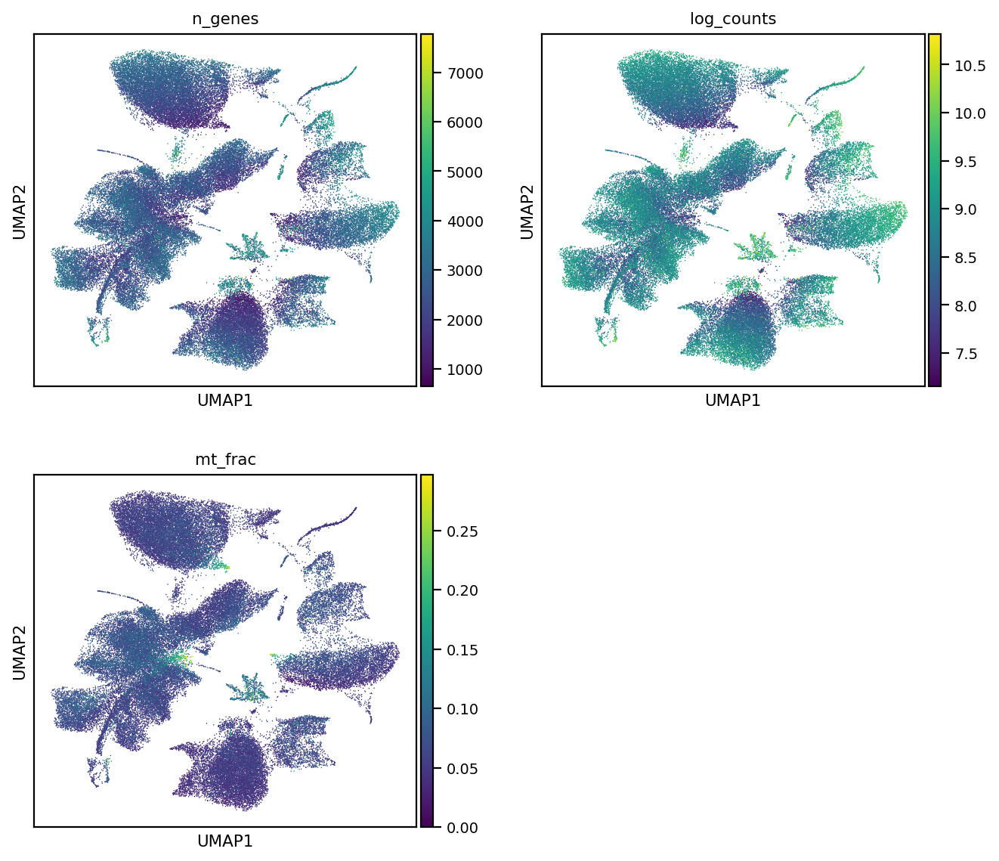

In [ ]:
sc.pp.neighbors(adata, n_pcs=50,n_neighbors=10,random_state=random_state)
#bbknn.bbknn(adata,batch_key = "sample", neighbors_within_batch =20, n_pcs = 100)

genes_to_plot = ['n_genes','log_counts','mt_frac']
sc.tl.umap(adata,random_state=42)
savefig="_QC_doublets_vst_mito02.pdf"
sc.pl.umap(adata, color = genes_to_plot,ncols=2,save=savefig)

# Clustering

In [ ]:
sc.tl.leiden(adata,random_state=random_state,resolution=1,)

In [ ]:
sc.tl.leiden(adata,random_state=random_state,resolution=1.5, key_added='leiden_r1.5')
sc.tl.leiden(adata,random_state=random_state,resolution=1, key_added='leiden_r1')
sc.tl.leiden(adata,random_state=random_state, resolution=0.8, key_added='leiden_r0.8')
sc.tl.leiden(adata,random_state=random_state, resolution=0.5, key_added='leiden_r0.5')
sc.tl.leiden(adata,random_state=random_state, resolution=0.4, key_added='leiden_r0.4')
sc.tl.leiden(adata,random_state=random_state, resolution=0.3, key_added='leiden_r0.3')
sc.tl.leiden(adata,random_state=random_state, resolution=0.2, key_added='leiden_r0.2')

In [ ]:
sb.set_context('talk')
pl.rcParams['figure.figsize']=(5,5)
#sc.tl.leiden(adata,random_state=random_state, resolution = 0.5)
savefig=samplename+"_clustering_vst_lowres.pdf"
sc.pl.umap(adata, color=['leiden_r0.2','leiden_r0.3','leiden_r0.4'], legend_loc='on data',legend_fontoutline=3, legend_fontweight='normal',frameon=False,save=savefig)

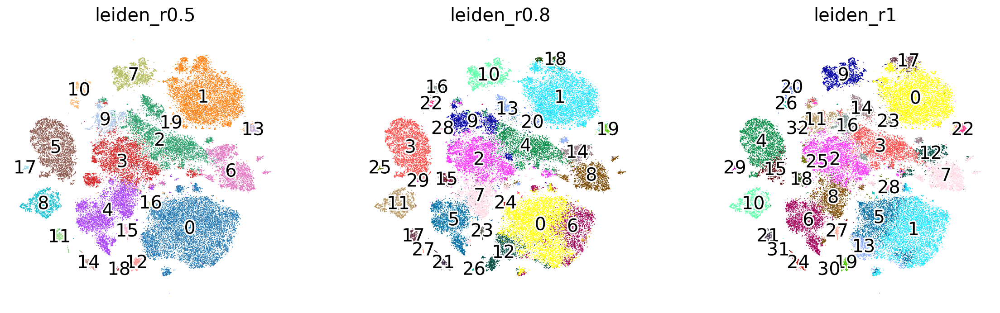

In [31]:
sb.set_context('talk')
pl.rcParams['figure.figsize']=(5,5)
#sc.tl.leiden(adata,random_state=random_state, resolution = 0.5)
savefig=samplename+"_clustering_vst_hires.pdf"
sc.pl.tsne(adata, color=['leiden_r0.5','leiden_r0.8','leiden_r1'], legend_loc='on data',legend_fontoutline=3, legend_fontweight='normal',frameon=False,save=savefig)

In [4]:
adata=sc.read('PBMC_cluster.h5ad')
adata

AnnData object with n_obs × n_vars = 67227 × 57103
    obs: 'species', 'sample', 'tscp_count', 'tscp_count_50dup', 'gene_count', 'n_counts', 'log_counts', 'n_genes', 'mt_frac', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito', 'leiden_r1.5', 'leiden_r1', 'leiden_r0.8', 'leiden_r0.5', 'leiden_r0.4', 'leiden_r0.3', 'leiden_r0.2'
    var: 'gene_id', 'genome', 'mito', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'means', 'variances', 'residual_variances', 'highly_variable_rank', 'highly_variable_nbatches', 'highly_variable_intersection', 'highly_variable'
    uns: 'hvg', 'leiden', 'leiden_r0.2_colors', 'leiden_r0.3_colors', 'leiden_r0.4_colors', 'leiden_r0.5_colors', 'leiden_r0.8_colors', 'leid

In [6]:
markers = [
    "IL7R",
    "LYZ",
    "CD14",
    "MS4A1",
    "CD8A",
    "GNLY",
    "NKG7",
    "FCGR3A",
    "MS4A7",
    "FCER1A",
    "CST3",
    "FOXP3","CLEC9A"
]

In [25]:
regex = re.compile('^(PTPRC).*', re.IGNORECASE)
genes = [l for l in adata.var_names for m in [regex.search(l)] if m]
genes

['PTPRC', 'PTPRCAP']

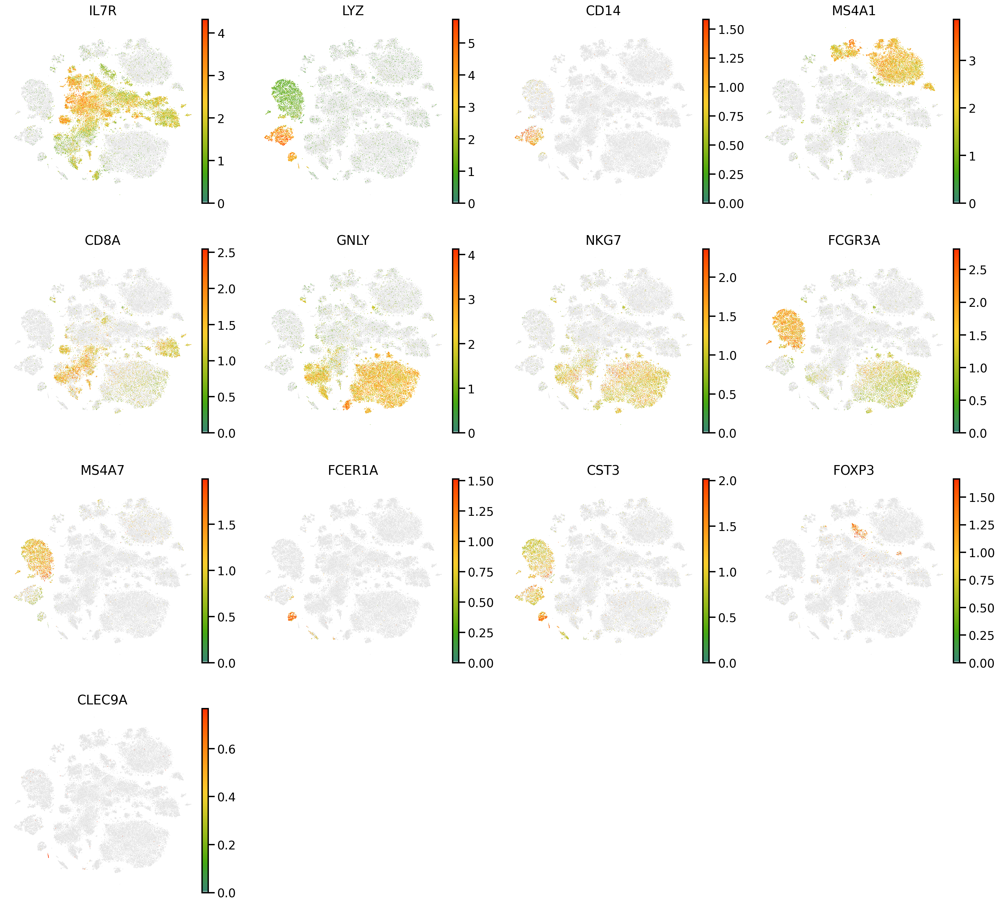

In [29]:
sb.set_context('talk')
pl.rcParams['figure.figsize']=(5,5)
#sc.tl.leiden(adata,random_state=random_state, resolution = 0.5)
savefig=samplename+"_clustering_vst_hires.pdf"
sc.pl.tsne(adata, color=markers, legend_fontoutline=3, legend_fontweight='normal',frameon=False,save=savefig,vmin='p10',vmax='p99.9',cmap=mymap,layer="sqrt_norm")

In [ ]:
sc.tl.tsne(adata, use_rep="X_pca")

/usr/local/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,


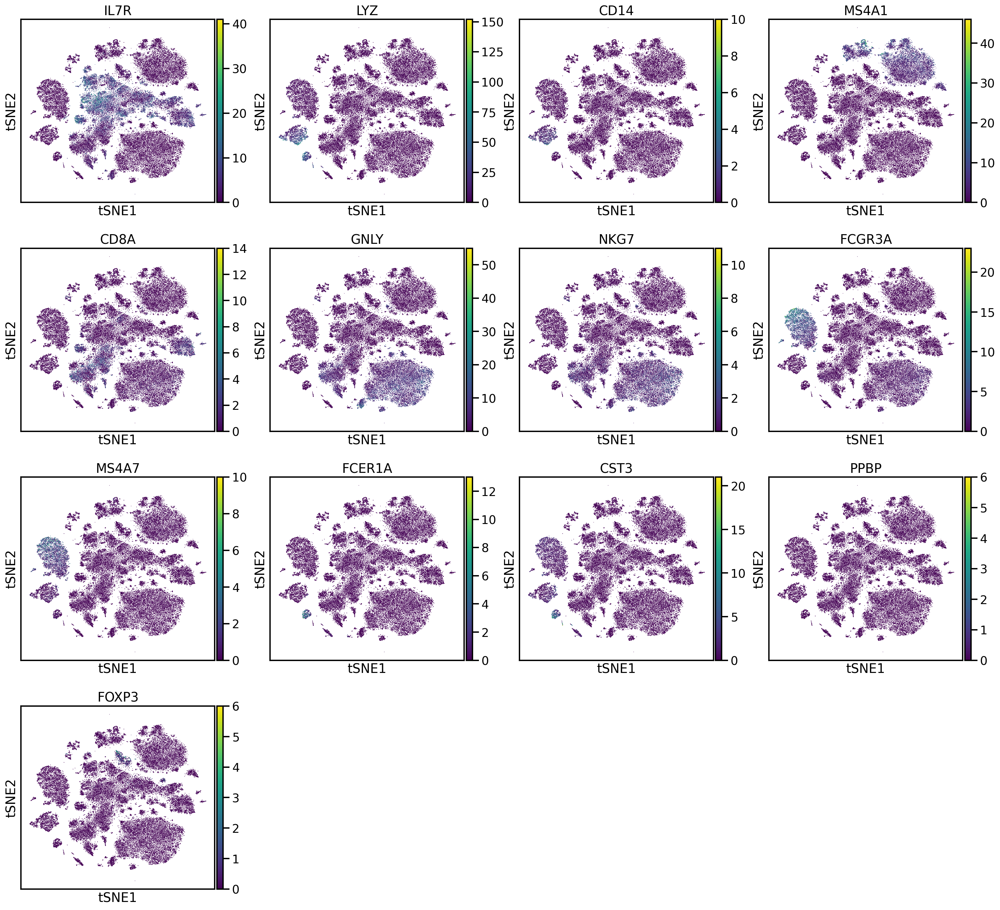

In [ ]:
sc.pl.tsne(adata, color=markers,)

In [ ]:
sb.set_context('paper')
pl.rcParams['lines.linewidth'] = 0.1
import matplotlib.pyplot as plt

fig, (ax1, ax2, ax3) = pl.subplots(1, 3, figsize=(16,4), gridspec_kw={'wspace':0.2})

ax1_dict = sc.pl.umap(adata, color='donnor', groups=['D1'], ax=ax1, show=False)
ax2_dict =  sc.pl.umap(adata, color='donnor', groups=['D2'], ax=ax2, show=False)
ax3_dict = sc.pl.umap(adata, color='donnor', groups=['D3'], ax=ax3, show=False,)
savefig='figures/'+samplename + '_3_QC_dataintegration.pdf'
fig.savefig(savefig, dpi=300, bbox_inches='tight')

In [ ]:
#ax = sc.pl.umap(adata, size=100, show=False)
#sc.pl.umap(adata[adata.obs["donnor"] == "D2"],color=[ 'condition'],ax=ax)

In [ ]:
sb.set_context('paper')
pl.rcParams['figure.figsize']=(5,5)
#sc.tl.leiden(adata,random_state=random_state, resolution = 0.5)
savefig=samplename+"_clustering_hires_vst.pdf"
sc.pl.umap(adata, color=['leiden_r1','FOXP3'], legend_loc='on data',legend_fontoutline=3,legend_fontsize='small', legend_fontweight='normal',frameon=False,save=savefig)

In [ ]:
sb.set_context('paper')
pl.rcParams['figure.figsize']=(5,5)
#sc.tl.leiden(adata,random_state=random_state, resolution = 0.5)
savefig=samplename+"_clustering_hires_vst.pdf"
sc.pl.umap(adata, color=['leiden_r1','FOXP3'], legend_loc='on data',legend_fontoutline=3,legend_fontsize='small', legend_fontweight='normal',frameon=False,save=savefig)

In [14]:
adata.X = adata.layers['counts']

In [5]:
sc.pp.log1p(adata)

In [6]:
sc.tl.leiden(adata, resolution=1.0)
#cello_resource_loc = os.getcwd()
cello_resource_loc = "."

In [7]:
adata.X = adata.X.todense()

In [8]:
adata.write('annotation.h5ad')

In [ ]:
#adata = adata[:, adata.var["highly_variable"]]

In [ ]:
adata.shape

(11248, 1914)

In [ ]:
model_prefix = "PBMC_NORMAL1" # <-- The trained model will be stored in a file called GSM3516666_LX682_NORMAL.model.dill 

cello.scanpy_cello(
    adata, 
    'leiden',
    cello_resource_loc, 
    out_prefix=model_prefix
)

Found CellO resources at './resources'.
Checking if any pre-trained model is compatible with this input dataset...


/usr/local/lib/python3.7/site-packages/sklearn/base.py:333: UserWarning: Trying to unpickle estimator PCA from version 0.22.2.post1 when using version 1.0.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/modules/model_persistence.html#security-maintainability-limitations
  UserWarning,
/usr/local/lib/python3.7/site-packages/sklearn/base.py:333: UserWarning: Trying to unpickle estimator LogisticRegression from version 0.22.2.post1 when using version 1.0.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/modules/model_persistence.html#security-maintainability-limitations
  UserWarning,


Could not find compatible pre-trained model.
Found CellO resources at './resources'.
Loading ontology...
Loading expression data from ./resources/training_set/log_tpm.h5...
Loaded matrix of shape (4293, 58243)
done.
Inferred that input file uses HGNC gene symbols.
Of 57103 genes in the input file, 35509 were found in the training set of 58243 genes.
Training model...
Fitting PCA with 3000 components...


In [ ]:
model_prefix = "PBMC_NORMAL"

cello.scanpy_cello(
    adata, 
    'leiden',
    cello_resource_loc, 
    model_file=f'{model_prefix}.model.dill'
)

In [ ]:
sc.pl.tsne(adata, color='Most specific cell type', return_fig=True)

In [ ]:
sc.pl.umap(adata, color='T cell (binary)', return_fig=True)

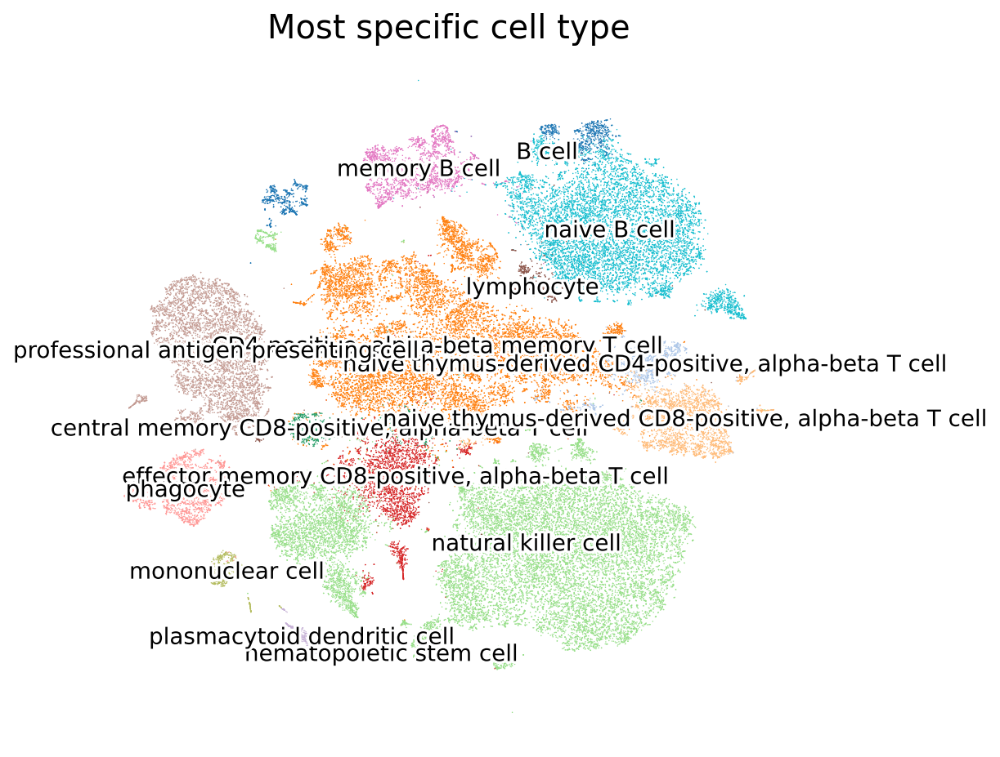

In [15]:
sb.set_context('talk')
pl.rcParams['figure.figsize']=(7,7)
#sc.tl.leiden(adata,random_state=random_state, resolution = 0.5)
savefig=samplename+"_annotated_hires_annotated.pdf"
sc.pl.tsne(adata, color=['Most specific cell type'], legend_loc='on data',cmap=mymap,legend_fontoutline=3,vmax='p99.9',legend_fontsize='x-small', legend_fontweight='normal',frameon=False,save=savefig)

In [ ]:
sb.set_context('talk')
pl.rcParams['figure.figsize']=(10,10)
#sc.tl.leiden(adata,random_state=random_state, resolution = 0.5)
savefig=samplename+"_annotated_hires_annotated.pdf"
sc.pl.umap(adata, color=['Most specific cell type'], legend_loc='on data',cmap=mymap,legend_fontoutline=3,vmax='p99.9',legend_fontsize='x-small', legend_fontweight='normal',frameon=False,save=savefig)

In [30]:
#method : {‘logreg’, ‘t-test’, ‘wilcoxon’, ‘t-test_overestim_var’} | None (default: None)
sc.tl.rank_genes_groups(adata, 'leiden_r1', method='logreg',n_genes=adata.shape[1])
markers=pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(50)
markers

/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32
0,AFF3,LINC00298,IL7R,TSHZ2,LYN,CD247,SGCD,NELL2,P2RY8,SOX5,VCAN,ADAM12,EDA,LDB2,C15orf53,LYN,AC105402.3,ADARB2,ITGA1,NCAM1,IGHA1,LRMDA,DLGAP2,BANK1,TCF4,ZBTB16,MKI67,AGBL4,SGCD,MEG3,ELMO1,WDFY4,FSTL4
1,BANK1,LINGO2,ADAM23,INPP4B,NEAT1,RNU4-2,ZEB2,EDA,ARID5B,PDE4D,JARID2,PTPN13,FHIT,ATP8B4,TTN,NEAT1,C15orf53,LINC01505-1,DOCK10,PPP1R9A,IGHA2,ARHGAP26,AFF3,AFF3,LINC-PINT,SLC4A10,CD247,THEMIS,LINC00298,LYN,MSI2,HDAC9,ARHGAP15
2,COL19A1,CD247,RASGRF2,ANK3,NAMPT,LINGO2,GNLY,PLXNA4,PCAT1,BANK1,LYZ,DLGAP1,LEF1,ZBTB16,IKZF2,TCF7L2,LINC01362,AFF3,CD96,ATP8B4,IGKC,JARID2,BACH2,NFKB1,AFF3,LINC00298,AOAH,AKNA,EPDR1,MEG8,ZNF385D,CCSER1,PRKG1
3,CD83,BNC2,DPP4,IL6ST,TCF7L2,RNF149,TGFBR3,ASTL,USP36,AFF3,ARHGAP26,FRY,FAM13A,IL18RAP,PLCL1,NAMPT,SEMA5A,SOX5,IL7R,NCALD,TRIO,LYZ,EIF2AK3,BACH2,PDE4B,TSHZ2,CENPF,CD6,AOAH,NEAT1,CDK6,CD74,MGAT5
4,BACH2,EPDR1,ANK3,ARID5B,MTSS1,SYNE2,PPP2R2B,BCL11B,RUNX3,OSBPL10,NEAT1,MCF2L2,BCL11B,MCTP2,LDLRAD4,SAT1,RF00100,PRKCB,ITGA4,ZMAT4,MAN1A1,SLC8A1,COL19A1,EZR,FCHSD2,CD247,DIAPH3,PARP8,CD247,NAMPT,CNTNAP2,NEGR1,RORA
5,ARHGAP24,AOAH,NELL2,PRKCA,CCDC26,AOAH,THEMIS,GALNT13,PITPNC1,RALGPS2,THBS1,PTPN4,TSHZ2,YES1,RASA3,MTSS1,EGR1,TCF4,PARP8,CD44,ELL2,PLXDC2,SNX9,COL19A1,CD74,PLCB1,AC007240.1,ANK3,AGAP1,MTSS1,NKAIN2,AUTS2,CDC14A
6,FCHSD2,SYNE1,P2RY8,CAMK4,TBC1D8,SYNE1,PRKCH,SEMA4D,CASK,BACH2,LRMDA,CCR6,BTBD11,DAB1,RBMS3,RNF149,TIAM1,LYN,TNFAIP3,ATP10A,MKI67,VCAN,CD83,BCL2,AC023590.1,AOAH,TOX,PITPNC1,TGFBR3,TCF7L2,ATP8B4,CAMK2D,ADAM19
7,FCRL1,MIR646HG,NR4A1,PVT1,SAT1,MYO1F,SYNE1,MBNL1,ATG2A,ARHGAP24,FAM49A,RORA,TCF7,ABHD2,TOX,NKTR,TSHZ2,BACH2,PAG1,LRMDA,HSP90B1,MAML3,ITPR1,ANKRD44,LRRFIP1,ADAM12,SMC4,SYNE1,RAP1GAP2,SLC8A1,RUNX1,CLNK,GRIP1
8,RUBCNL,MCTP2,INPP4B,FAAH2,IFI30,UTRN,PPP2R5C,THEMIS,SFMBT2,CDK14,LRRFIP1,EML4,ANK3,ATP8A1,AC093865.1,NFKBIZ,TTN,RAB30,PDE3B,RUNX2,IGLC2,DPYD,FCRL1,NELL2,EPHB1,SYNE1,ASPM,FAM129A,MCTP2,PECAM1,ETV6,JMJD1C,LINC01229
9,CD74,RAP1GAP2,PCAT1,SLC9A9,ZEB2,TENT4B,HIVEP3,OXNAD1,ARHGAP26,SEL1L3,PLXDC2,SPOCK2,CAMK4,AF165147.1,PELI1,LILRB2,LMNA,PCDH9,ARHGAP15,GNLY,FUT8,AFF3,CHST11,SLC38A1,ZFAT,CELF2,CENPP,CAMKMT,SYNE1,GRK3,MED12L,ASAP1,KLF12


In [ ]:
savetable=samplename+"_marker_genes_leidenB.csv"
markers.to_csv(savetable)

In [ ]:
marker_genes = ['JCHAIN','IRF8','HLA-DRA','NCAM1','NCR1', 'GNLY', 'NKG7', 'KLRB1','FCGR3A','IL7R','CD8A', 'CD8B','B3GAT1']
sb.set_context('paper')
pl.rcParams['figure.figsize']=(4,4) #rescale figures
savefig=samplename+"_markers_vst_2.pdf"
sc.pl.umap(adata=adata, color=marker_genes,color_map=mymap,vmin='p10', vmax='p99.9',ncols=4,
           legend_loc='on data',legend_fontoutline=3, legend_fontweight='normal',use_raw=True, save=savefig)

# Known markers

In [ ]:
marker_genes_dict = {
    'pDC': ['JCHAIN','IRF8','PTPRS','RHEX',],
    'mregDC':['LAMP3','SLCO5A1','IDO1','MARCKS','CRLF2','MARCKSL1',],
    'DC3':['PLA2G7','ITGAX','FCER1G','PTPRE','DOCK4','LYZ','C15orf48','CYP1B1','STAB1','CYP27A1','GPR68','CD14'],
    'DC2':['SYT17','EDN1','CTLA4','INHBA','SPRED1','FMNL2','IL1RN',],
    'NK': ['GNLY','KLRD1','C1orf21','LINC00996','TXK','ZBTB16','NCAM1',],
    'T-cell': ['IL7R','CD3D','CD3G','LTB','CCL5','CD247'],
    'B-cell': ['CD79A', 'MS4A1','AFF3','IGKC','IGHM','BANK1']
}

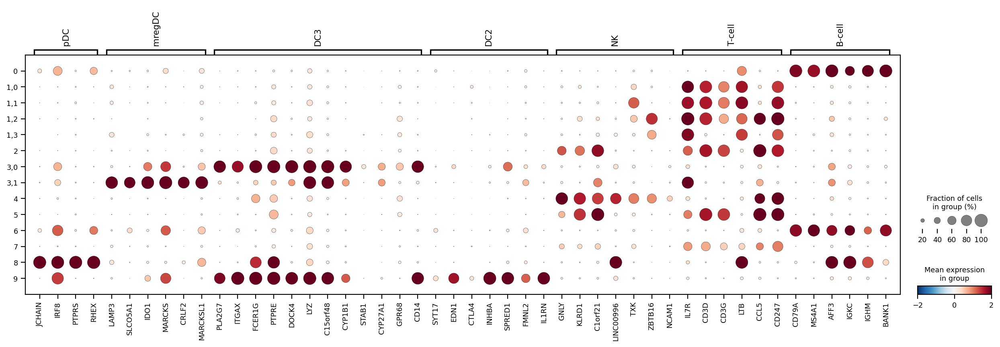

In [ ]:
sb.set_context('paper')
savefig=samplename+"_Dotplot_markers_all.pdf"
sc.pl.dotplot(adata, 
                  var_names=marker_genes_dict,
                  vmin=-2, vmax=2, cmap='RdBu_r', groupby='leidenB', return_fig=False, dendrogram=False,save=savefig)

In [ ]:
cluster=samplename+"_Annotated_vst.h5ad"
adata.write(cluster)

In [ ]:
sb.set_context('talk')
pl.rcParams['figure.figsize']=(5,5)
#sc.tl.leiden(adata,random_state=random_state, resolution = 0.5)
savefig=samplename+"_clustering_vst_bbknn.pdf"
sc.pl.umap(adata, color=['HLA-DRA','C5AR1','FCAR','FCER1A','CD14',"CLEC9A",'CD1C','CCR7','FCGR3A','CD163','NEAT1','LCK','CD3E','LMNA'],cmap=mymap,legend_fontoutline=3, 
           hspace=0.5,wspace=0.5,legend_fontweight='normal',frameon=False,save=savefig)

In [ ]:
adata


AnnData object with n_obs × n_vars = 4822 × 36484
    obs: 'sample', 'condition', 'donnor', 'n_counts', 'log_counts', 'n_genes', 'mt_frac', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito', 'doublet_score', 'predicted_doublet', 'leiden_r1.5', 'leiden_r1', 'leiden_r0.8', 'leiden_r0.5', 'leiden_r0.4', 'leiden_r0.3', 'leiden_r0.2'
    var: 'gene_ids', 'feature_types', 'mito', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'means', 'variances', 'residual_variances', 'highly_variable_rank', 'highly_variable'
    uns: 'sample_colors', 'scrublet', 'hvg', 'pca', 'pearson_residuals_normalization', 'log1p', 'neighbors', 'umap', 'leiden', 'leiden_r0.2_colors', 'leiden_r0.3_colors', 'leiden_r0.4_colors',

In [ ]:
#PBMC marker genes
marker_genes = ['FOXP3','IDO1','IL7R', 'CD79A', 'MS4A1', 'CD4','CD8A', 'CD8B', 'LYZ', 'CD14','LGALS3', 'S100A8', 'GNLY', 'NKG7','NCR1', 'KLRB1','FCGR3A', 'MS4A7', 'FCER1A', 'CST3','HLA-DRA', 'PPBP']

In [ ]:
print(len(marker_genes))
filter=np.in1d(marker_genes, adata.var_names)
marker_genes = list(np.array(marker_genes)[filter])
print(len(marker_genes))
marker_genes.append("leiden_r0.5")
marker_genes.append("condition")

27
27


In [ ]:
sb.set_context('paper')
pl.rcParams['figure.figsize']=(4,4) #rescale figures
savefig=samplename+"_markers_vst_2.pdf"
sc.pl.umap(adata=adata, color=marker_genes,color_map=mymap,vmin=1, vmax='p99.9',ncols=4,
           legend_loc='on data',legend_fontoutline=3, legend_fontweight='normal',use_raw=True, save=savefig)

# sample composition

###code

In [65]:
#@title composition
import logging
import numpy as np
import pandas as pd
from plotnine import *
from plotnine.data import diamonds as ddata
import matplotlib.gridspec as gridspec


def get_proportions_per_channel(adata, sample_key, proportion_key, covariates=None):

    prop_df = pd.DataFrame(adata.obs.groupby([sample_key, proportion_key]).size(), columns=['ncell']).reset_index()

    prop_df = prop_df.pivot(index=sample_key, columns=proportion_key, values='ncell').fillna(0)
    prop_df.columns.name = None
    prop_df.columns = prop_df.columns.astype(str)
    prop_df /= prop_df.sum(1).values[:, None]
    prop_df.index = prop_df.index.astype(str)

    if covariates is not None:
        assert np.all(np.isin(covariates, adata.obs.columns))

        # check if all categoricals are nested in sample_key
        cat_covariates = [x for x in covariates if adata.obs[x].dtype.kind not in 'biufc']
        if cat_covariates:
            assert len(adata.obs[[sample_key] + cat_covariates].drop_duplicates()) == adata.obs[sample_key].nunique()

        covar_df = adata.obs.groupby(sample_key)[covariates].agg(**{x: pd.NamedAgg(x, 'first') if x in cat_covariates else pd.NamedAgg(x, 'mean') for x in covariates})
        covar_df = covar_df.loc[prop_df.index.values]
        covar_df.index = covar_df.index.astype(str)

        for c in cat_covariates:
            if adata.obs[c].dtype.name == 'category':
                covar_df[c] = pd.Categorical(covar_df[c], categories=adata.obs[c].cat.categories)

        assert np.all(prop_df.index == covar_df.index)

        return prop_df, covar_df
    else:
        return prop_df



def dirichletreg(adata, sample_key, proportion_key, covariates, formula, onevsrest_category=None, return_reg_input=False):

    from rpy2.robjects import r, Formula
    from rpy2.robjects.packages import importr
    from rpy2.rinterface_lib.callbacks import logger as rpy2_logger

    adata._sanitize()
    prop_df, covar_df = get_proportions_per_channel(adata, sample_key, proportion_key, covariates)
    dr_df = pd.concat([prop_df, covar_df], axis=1)

    dr = importr('DirichletReg')

    f = Formula(formula)

    rpy2_logger.setLevel(logging.ERROR)   # will display errors, but not warnings
    f.environment['y'] = dr.DR_data(py2r(prop_df))
    rpy2_logger.setLevel(logging.WARNING)   # will display errors, but not warnings

    if onevsrest_category is None:
        fit = dr.DirichReg(f, py2r(dr_df))
    else:
        assert onevsrest_category in adata.obs[proportion_key].cat.categories
        cat_index = adata.obs[proportion_key].cat.categories.tolist().index(onevsrest_category) + 1
        fit = dr.DirichReg(f, py2r(dr_df), model='alternative', **{'sub.comp': cat_index})

    r.sink(r.tempfile()) # quietly
    u = r.summary(fit)
    r.sink()

    if onevsrest_category is None:
        varnames = u.rx2('varnames')
    else:
        varnames = [onevsrest_category] * 2

    coef_mat = u.rx2('coef.mat')
    rows = r2py(r('rownames')(coef_mat))
    coef_df = r2py(r('as.data.frame')(coef_mat)).reset_index(drop=True)
    coef_df.columns = ['coefficient', 'se', 'zval', 'pval']

    coef_df['compartment'] = np.repeat(varnames, r2py(u.rx2('n.vars')))
    coef_df['variable'] = rows
    coef_df['significance'] = bin_pval(coef_df.pval)

    if onevsrest_category is not None:
        coef_df['coef_type'] = np.repeat(['mean', 'precision'], r2py(u.rx2('n.vars')))

    if return_reg_input:
        return dr_df, coef_df
    else:
        return coef_df


def plot_proportion_barplot(
    adata,
    yaxis,
    fill, 
    fill_breakdown=None,
    yaxis_label=None,
    fill_label=None,
    percent_limit=5., 
    show_percent=True,
    height_scale=1., 
    width_scale=1.,
    legend_position=(-0.3, 0.5),
    return_df=False,
    normalize_by=None,
    format_x_as_percent=True,
    remove_x_axis_ticks=False,
):

    import mizani
    import matplotlib.patheffects as pe

    if yaxis_label is None: yaxis_label = yaxis
    if fill_label is None: fill_label = fill

    adata._sanitize()

    fill_dict = {k:v for k,v in zip(adata.obs[fill].cat.categories, adata.uns[f'{fill}_colors'])}

    df_level1 = pd.DataFrame(adata.obs.groupby([yaxis, fill] + ([fill_breakdown] if fill_breakdown else []), observed=True).size(), columns=['counts'])

    if normalize_by:
        scales = df_level1.reset_index().groupby(normalize_by)[['counts']].sum()
        scales = scales.sum().div(scales)

        df_level1 = df_level1.multiply(scales)

    df_level0 = df_level1.reset_index().groupby(yaxis)[['counts']].sum()
    df = df_level1.div(df_level0, level=yaxis).reset_index()
    
    df[fill]  = pd.Categorical(df[fill], categories=reversed(adata.obs[fill].cat.categories))
    df[yaxis] = pd.Categorical(df[yaxis], categories=reversed(adata.obs[yaxis].cat.categories))

    df['counts_coarse'] = df.groupby([yaxis, fill], observed=True)['counts'].transform('sum')
    df['counts_coarse_round_percent'] = (df.counts_coarse*100).round().astype(int)

    df['_show_text'] = df.counts_coarse_round_percent >= percent_limit
    df['_show_breakdown'] = (df.counts_coarse_round_percent >= percent_limit) if fill_breakdown else False
        
    # collapse breakdown of small groups
    if fill_breakdown:
        df = df[(~df.duplicated([yaxis, fill])) | (df._show_breakdown)].copy()
        df.loc[~df._show_breakdown, 'counts'] = df.loc[~df._show_breakdown, 'counts_coarse']
        df['_show_breakdown'] = True
        
    cs = df.sort_values([yaxis, fill], ascending=False).drop_duplicates([yaxis, fill]).groupby(yaxis, observed=True)['counts_coarse'].transform(pd.Series.cumsum)
    df['cumsum_mean'] = cs - df['counts_coarse'] + (df['counts_coarse']/2)        

    g = (
        ggplot(aes(x=yaxis, y='counts', fill=fill, group=fill), data=df) +
        geom_bar(position='fill', stat='identity', mapping=aes(color='_show_breakdown'), size=0.08) +
        (scale_y_continuous(labels=mizani.formatters.percent) if format_x_as_percent else geom_blank()) +
        coord_flip() +
        theme_minimal() +
        theme(
            figure_size=(8*width_scale, 
                         0.4*df[yaxis].nunique()*height_scale),
            legend_position=legend_position,
            axis_text_x=element_blank() if remove_x_axis_ticks else None, 
            axis_ticks_major_x=element_blank() if remove_x_axis_ticks else None, 
            axis_ticks_minor_x=element_blank() if remove_x_axis_ticks else None, 
            ) + 
        scale_color_manual(values={True: 'black', False: 'none'}) +
        scale_fill_manual(values=fill_dict) +        
        labs(x=yaxis_label, y=fill_label) +
        guides(fill = guide_legend(reverse=True), color=None)
    )

    if show_percent:
        g += geom_text(aes(label='counts_coarse_round_percent', y='cumsum_mean'), data=df[df._show_text],
                  color='white', size=8, fontweight='bold',
                  path_effects=(pe.Stroke(linewidth=1, foreground='black'), pe.Normal()))

    if return_df:
        return g, df
    else:
        return g

    
def plot_proportion_barplot_cellcounts(
    adata,
    yaxis,
    height_scale=1., 
    width_scale=1.,
    legend_position=None,
):

    import mizani
    import matplotlib.patheffects as pe
    
    adata._sanitize()

    df = pd.DataFrame(adata.obs.groupby([yaxis], observed=True).size(), columns=['ncell']).reset_index()
    df['counts'] = 1
    df[yaxis] = pd.Categorical(df[yaxis], categories=reversed(adata.obs[yaxis].cat.categories))    
    

    g = (
        ggplot(aes(x=yaxis, y='counts', fill='ncell.astype(float)'), data=df) +
        geom_col() +
        coord_flip() +
        theme_minimal() +
        theme(figure_size=(1.*width_scale, 
                           0.4*df[yaxis].nunique()*height_scale),
              axis_text_y=element_blank(),
              legend_position=legend_position) +  
        labs(x=None, y='Cell counts', fill='Cell counts') +
        geom_text(aes(label='ncell', y=0.5),
                  color='white', size=8, fontweight='bold',
                  path_effects=(pe.Stroke(linewidth=1, foreground='black'), pe.Normal())) + 
        scale_fill_continuous(trans='log10', cmap_name='magma')
    )

    return g


def plot_proportion_barplot_single_categorical(
    adata,
    yaxis,
    fill,
    height_scale=1., 
    width_scale=1.,
    legend_position=None,
):

    import mizani
    import matplotlib.patheffects as pe
    
    adata._sanitize()

    fill_dict = {k:v for k,v in zip(adata.obs[fill].cat.categories, adata.uns[f'{fill}_colors'])}
    
    df = adata.obs[[yaxis, fill]].drop_duplicates().reset_index()
    df['counts'] = 1
    df[yaxis] = pd.Categorical(df[yaxis], categories=reversed(adata.obs[yaxis].cat.categories))    

    g = (
        ggplot(aes(x=yaxis, y='counts', fill=fill), data=df) +
        geom_col() +
        coord_flip() +
        theme_minimal() +
        theme(figure_size=(1.*width_scale, 
                           0.4*df[yaxis].nunique()*height_scale),
              axis_text_y=element_blank(),
              legend_position=legend_position) +  
        labs(x=None, y=fill, fill=fill) +
        scale_fill_manual(values=fill_dict)
    )

    return g


def merge_ggplots(*plots, figsize, units=None, orientation='horizontal'):
    
    if units is None:
        units = [1]*len(plots)

    # Empty plotnine figure to place the subplots on. Needs junk data (for backend "copy" reasons).
    fig = (ggplot()+geom_blank(data=ddata)+theme_void() + theme(figure_size=figsize)).draw()

    if orientation == 'horizontal':
        # Create gridspec for adding subpanels to the blank figure
        gs = gridspec.GridSpec(1,np.sum(units))
    else:
        gs = gridspec.GridSpec(np.sum(units), 1)

    prev = 0
    for p, u in zip(plots, np.cumsum(units)):
        if orientation == 'horizontal':
            ax = fig.add_subplot(gs[0, prev:u])
        else:
            ax = fig.add_subplot(gs[prev:u, 0])
        prev = u
        _ = p._draw_using_figure(fig, [ax])

    return fig


def plot_proportion_barplot_with_ncells(
    adata,
    yaxis,
    fill, 
    fill_breakdown=None,
    yaxis_label=None,
    fill_label=None,
    percent_limit=5., 
    show_percent=True,
    height_scale=1., 
    width_scale=1.,
    legend_position=(-0.2, 0.5),
    normalize_by=None,
):
    
    g1, df = plot_proportion_barplot(
        adata,
        yaxis,
        fill, 
        fill_breakdown=fill_breakdown,
        yaxis_label=yaxis_label,
        fill_label=fill_label,
        percent_limit=percent_limit, 
        show_percent=show_percent,
        height_scale=height_scale, 
        width_scale=width_scale,
        legend_position=legend_position,
        return_df=True,
        normalize_by=normalize_by,
    )
    
    g2 = plot_proportion_barplot_cellcounts(adata, yaxis)
    figsize = (8*width_scale*1.5, 0.4*df[yaxis].nunique()*height_scale)
    
    return merge_ggplots(g1, g2, units=[9, 1], figsize=figsize)


def plot_proportions(adata, sample_key, proportion_key, covariates, fill, return_input_df=False, kind='boxplot', dotplot_binwidth=0.001, width_scale=1., height_scale=1.):

    adata._sanitize()
    p, c = get_proportions_per_channel(adata, sample_key, proportion_key, covariates)
    dr_df = pd.concat([p, c], axis=1)

    proportion_df = dr_df.reset_index().melt(id_vars=[sample_key] + covariates,
                                             value_vars=adata.obs[proportion_key].cat.categories,
                                             var_name='categorical',
                                             value_name='proportion').set_index(sample_key)

    proportion_df['categorical'] = pd.Categorical(proportion_df['categorical'], categories=adata.obs[proportion_key].cat.categories)
    color_dict = {k:v for k,v in zip(adata.obs[fill].cat.categories, adata.uns[f'{fill}_colors'])}

    if kind == 'dotplot':
        geom = geom_dotplot(position='dodge', binaxis = "y", stackdir = "center", binwidth = dotplot_binwidth)
    else:
        geom = geom_boxplot()

    g = (
        ggplot(proportion_df, aes(x='categorical', y='proportion', fill=fill)) +
        geom +
        scale_fill_manual(values=color_dict) +
        labs(y='Proportions', x='', fill=fill) +
        theme_classic() +
        theme(figure_size=(8*width_scale,6*height_scale), axis_text_x = element_text(angle = 45, hjust=1.))
    )

    if return_input_df:
        return g, proportion_df
    else:
        return g



#plots

In [58]:
get_proportions_per_channel(adata,'sample','leiden_r0.5', covariates=None)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
sample,,,,,,,,,,,,,,,,,,,,
one-samp,0.212519,0.151918,0.109911,0.106683,0.10646,0.087361,0.068752,0.038794,0.033067,0.025481,0.01425,0.009966,0.009416,0.00775,0.006619,0.004775,0.002142,0.002023,0.001487,0.000625


In [63]:
 fig=plot_proportion_barplot_with_ncells(
    adata,
    'sample',
    fill='leiden_r0.5', 
    fill_breakdown=None,
    yaxis_label=None,
    fill_label=None,
    percent_limit=2., 
    show_percent=True,
    height_scale=1., 
    width_scale=1.,
    legend_position=(0, 0.5),
    normalize_by=None,)
 fig.savefig('cell_composition.pdf', dpi=300, bbox_inches='tight')

PlotnineError: ignored